In [6]:
import torch
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display
from sklearn.decomposition import PCA

from utils.ecdc_utils import (
    load_wav_mono,
    encode_audio_to_tokens,
    n_q_to_bandwidth,
    build_LOOKUP_via_layer_decode,
    tokens_to_summary_latents,
    latents128_to_audio,
)

import dac
import soundfile as sf
from audiotools import AudioSignal

In [ ]:
# ── EnCodec ───────────────────────────────────────────────────────
from transformers import EncodecModel

DEVICE   = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_ID = "facebook/encodec_24khz"

enc_model = EncodecModel.from_pretrained(MODEL_ID).to(DEVICE)
enc_model.eval()
print("Loaded EnCodec:", MODEL_ID)
print("Device:", DEVICE)


# ── DAC ───────────────────────────────────────────────────────────
dac_path  = dac.utils.download(model_type="24khz")
dac_model = dac.DAC.load(dac_path).to(DEVICE)
dac_model.eval()
print("Loaded DAC: 24khz")

Loaded EnCodec: facebook/encodec_24khz
Device: cpu


c:\Users\despn\Downloads\Generative algorithms\venv_enc\lib\site-packages\torch\nn\utils\weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Loaded DAC: 24khz


In [7]:
audio_dict = {
    "speech":   load_wav_mono("audio_files/voice_mono.wav"),
    "singing":  load_wav_mono("audio_files/singing_voice.wav"),
    "flute":    load_wav_mono("audio_files/flute_mono.wav"),
    "saxophone": load_wav_mono("audio_files/saxophone.wav"),
    "amen":  load_wav_mono("audio_files/amen.wav")
}

for name, audio in audio_dict.items():
    duration = audio.shape[-1] / 24000   # ← use last dimension, not len()
    print(f"{name}: {duration:.2f} sec  shape={tuple(audio.shape)}")
colors = {
    "saxophone":   "#ff6b35c5",
    "amen":    "#1D26CC",
    "speech":  "#7bffa0",
    "singing": "#ffd166",
    "flute":   "#c6b0ff",
}


speech: 3.27 sec  shape=(1, 78481)
singing: 7.62 sec  shape=(1, 182937)
flute: 3.74 sec  shape=(1, 89678)
saxophone: 6.66 sec  shape=(1, 159790)
amen: 10.00 sec  shape=(1, 240000)


### Encodec: encode + build look up table

In [8]:
N_Q_8       = 8
bandwidth = n_q_to_bandwidth(N_Q_8)
K         = enc_model.config.codebook_size

# encode all audio with EnCodec
enc_tokens_dict = {}
for name, audio in audio_dict.items():
    tokens_TN, _ = encode_audio_to_tokens(audio, enc_model, DEVICE, bandwidth)
    enc_tokens_dict[name] = tokens_TN
    print(f"{name}: EnCodec tokens shape = {tuple(tokens_TN.shape)}")

# build lookup table
LOOKUP_QKD = build_LOOKUP_via_layer_decode(enc_model, n_q=N_Q, K=K, device=DEVICE)
print(f"EnCodec 32: LOOKUP shape = {tuple(LOOKUP_QKD.shape)}")


# ── EnCodec @ 32 codebooks (24kbps) ──────────────────────────────
N_Q_32    = 32
bw_32     = n_q_to_bandwidth(N_Q_32)
enc_tokens_32 = {}
for name, audio in audio_dict.items():
    tokens_TN, _ = encode_audio_to_tokens(audio, enc_model, DEVICE, bw_32)
    enc_tokens_32[name] = tokens_TN
LOOKUP_32 = build_LOOKUP_via_layer_decode(enc_model, n_q=N_Q_32, K=K, device=DEVICE)
print(f"EnCodec 32: LOOKUP shape = {tuple(LOOKUP_32.shape)}")

encode_audio_to_tokens with n_q=8
speech: EnCodec tokens shape = (246, 8)
encode_audio_to_tokens with n_q=8
singing: EnCodec tokens shape = (572, 8)
encode_audio_to_tokens with n_q=8
flute: EnCodec tokens shape = (281, 8)
encode_audio_to_tokens with n_q=8
saxophone: EnCodec tokens shape = (500, 8)
encode_audio_to_tokens with n_q=8
amen: EnCodec tokens shape = (750, 8)
EnCodec 32: LOOKUP shape = (8, 1024, 128)
encode_audio_to_tokens with n_q=32
encode_audio_to_tokens with n_q=32
encode_audio_to_tokens with n_q=32
encode_audio_to_tokens with n_q=32
encode_audio_to_tokens with n_q=32
EnCodec 32: LOOKUP shape = (32, 1024, 128)


### DAC: encode

In [9]:
def encode_audio_dac(audio_np, dac_model, device, sr=24000):
    audio_np = audio_np.flatten()
    wav      = torch.tensor(audio_np).float().unsqueeze(0).unsqueeze(0).to(device)
    with torch.no_grad():
        z, codes, _, _, _ = dac_model.encode(wav)
    return codes[0].T.cpu()   # (T, n_q)

dac_tokens_dict = {}
for name, audio in audio_dict.items():
    dac_tokens_dict[name] = encode_audio_dac(audio, dac_model, DEVICE)
    print(f"{name}: DAC tokens shape = {tuple(dac_tokens_dict[name].shape)}")

N_Q_DAC = next(iter(dac_tokens_dict.values())).shape[1]
print(f"\nEnCodec codebooks: {N_Q}")
print(f"DAC codebooks:     {N_Q_DAC}")

C:\Users\despn\AppData\Local\Temp\ipykernel_18632\1594112435.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  wav      = torch.tensor(audio_np).float().unsqueeze(0).unsqueeze(0).to(device)


speech: DAC tokens shape = (245, 32)
singing: DAC tokens shape = (571, 32)
flute: DAC tokens shape = (280, 32)
saxophone: DAC tokens shape = (499, 32)
amen: DAC tokens shape = (750, 32)

EnCodec codebooks: 8
DAC codebooks:     32


### Decode functions

In [10]:
@torch.no_grad()
def decode_up_to_q_enc(tokens_TN, LOOKUP_QKD, model, device, up_to_q):
    """Decode EnCodec tokens using Q1 to Q(up_to_q+1) only."""
    T = tokens_TN.shape[0]
    z = torch.zeros(T, 128, device=LOOKUP_QKD.device, dtype=LOOKUP_QKD.dtype)
    for q in range(up_to_q + 1):
        z += LOOKUP_QKD[q][tokens_TN[:, q].to(LOOKUP_QKD.device)]
    return latents128_to_audio(model, z, device).cpu().numpy().flatten()


@torch.no_grad()
def decode_up_to_q_dac(codes_TN, dac_model, device, up_to_q):
    """Decode DAC tokens using Q1 to Q(up_to_q+1) only."""
    codes              = codes_TN.T.unsqueeze(0).to(device)   # (1, n_q, T)
    masked             = codes.clone()
    masked[:, up_to_q+1:, :] = 0
    z     = dac_model.quantizer.from_codes(masked)[0]         # (1, D, T)
    audio = dac_model.decoder(z)                               # (1, 1, samples)
    return audio.squeeze().cpu().numpy()

# ── decode EnCodec at all 8 levels ────────────────────────────────
enc_decoded_8 = {}
LEVELS_8  = list(range(N_Q_8))
for name, tokens in enc_tokens_dict.items():
    enc_decoded_8[name] = {}
    for up_to_q in range(N_Q_8):
        enc_decoded_8[name][up_to_q] = decode_up_to_q_enc(
            tokens, LOOKUP_QKD, enc_model, DEVICE, up_to_q)
    print(f"EnCodec decoded {name}")

LEVELS = [0, 1, 2, 3, 5, 7, 11, 15, 19, 23, 27, 31]
# ── EnCodec @ 32 codebooks (sparse) ──────────────────────────────
enc_decoded_32 = {}
for name, tokens in enc_tokens_32.items():
    enc_decoded_32[name] = {}
    for up_to_q in LEVELS:
        enc_decoded_32[name][up_to_q] = decode_up_to_q_enc(
            tokens, LOOKUP_32, enc_model, DEVICE, up_to_q)
    print(f"EnCodec@32 decoded {name} at levels {[q+1 for q in LEVELS]}")

# ── decode DAC at sparse levels (too many to do all 32) ───────────

dac_decoded_dict = {}
for name, tokens in dac_tokens_dict.items():
    dac_decoded_dict[name] = {}
    for up_to_q in LEVELS:
        dac_decoded_dict[name][up_to_q] = decode_up_to_q_dac(
            tokens, dac_model, DEVICE, up_to_q)
    print(f"DAC decoded {name} at levels {[q+1 for q in LEVELS]}")

EnCodec decoded speech
EnCodec decoded singing
EnCodec decoded flute
EnCodec decoded saxophone
EnCodec decoded amen
EnCodec@32 decoded speech at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
EnCodec@32 decoded singing at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
EnCodec@32 decoded flute at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
EnCodec@32 decoded saxophone at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
EnCodec@32 decoded amen at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
DAC decoded speech at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
DAC decoded singing at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
DAC decoded flute at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
DAC decoded saxophone at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]
DAC decoded amen at levels [1, 2, 3, 4, 6, 8, 12, 16, 20, 24, 28, 32]


### Feature extractors

In [20]:
from scipy.signal import medfilt

def extract_pitch(audio_np, sr=24000, hop=320):
    f0, voiced_flag, voiced_prob = librosa.pyin(
        audio_np,
        fmin=librosa.note_to_hz('C2'),
        fmax=librosa.note_to_hz('C7'),
        hop_length=hop,
        sr=sr,
        fill_na=np.nan,
        boltzmann_parameter=2,
        beta_parameters=(2, 18)
    )
    # remove frames where pyin is not confident about voicing
    f0[voiced_prob < 0.5] = np.nan

    # smooth out octave jumps on voiced frames only
    voiced = ~np.isnan(f0)
    if voiced.sum() > 3:
        f0[voiced] = medfilt(f0[voiced], kernel_size=3)

    return f0

def extract_centroid(audio_np, sr=24000, hop=320):
    return librosa.feature.spectral_centroid(
        y=audio_np, sr=sr, hop_length=hop)[0]

def extract_flatness(audio_np, sr=24000, hop=320):
    return librosa.feature.spectral_flatness(
        y=audio_np, hop_length=hop)[0]

def extract_mfcc(audio_np, sr=24000, hop=320, n_mfcc=13):
    return librosa.feature.mfcc(
        y=audio_np, sr=sr, hop_length=hop, n_mfcc=n_mfcc)

def extract_chroma(audio_np, sr=24000, hop=320):
    return librosa.feature.chroma_cqt(
        y=audio_np, sr=sr, hop_length=hop)

feature_extractors = {
    'pitch':    extract_pitch,
    'centroid': extract_centroid,
    'flatness': extract_flatness,
    'mfcc':     extract_mfcc,
    'chroma':   extract_chroma,
}

def feature_correlation(feat_test, feat_ref):
    """Pearson correlation — handles 1D and 2D features."""
    if feat_test.ndim == 1:
        T     = min(len(feat_test), len(feat_ref))
        valid = ~np.isnan(feat_test[:T]) & ~np.isnan(feat_ref[:T])
        if valid.sum() < 10:
            return np.nan
        return float(np.corrcoef(feat_test[:T][valid], feat_ref[:T][valid])[0, 1])
    else:
        corrs = []
        for d in range(feat_test.shape[0]):
            T     = min(feat_test.shape[1], feat_ref.shape[1])
            valid = ~np.isnan(feat_test[d, :T]) & ~np.isnan(feat_ref[d, :T])
            if valid.sum() < 10:
                continue
            corrs.append(float(np.corrcoef(
                feat_test[d, :T][valid],
                feat_ref[d,  :T][valid])[0, 1]))
        return float(np.mean(corrs)) if corrs else np.nan

### Run the experiment

In [21]:
def run_experiment(decoded_dict, audio_names, levels, label):
    results = {fn: {} for fn in feature_extractors}
    for name in audio_names:
        full_audio = decoded_dict[name][levels[-1]]
        print(f"\n{label} — {name}:")
        for feat_name, extractor in feature_extractors.items():
            feat_gt = extractor(full_audio)
            corrs   = []
            for q in levels:
                feat = extractor(decoded_dict[name][q])
                corrs.append(feature_correlation(feat, feat_gt))
            results[feat_name][name] = corrs
            print(f"  {feat_name:<10} "
                  f"Q1={corrs[0]:.3f} → Q{levels[-1]+1}={corrs[-1]:.3f}")
    return results

audio_names = list(audio_dict.keys())

print("═"*55 + "\nEnCodec @ 8 codebooks\n" + "═"*55)
res_enc8  = run_experiment(enc_decoded_8, audio_names, LEVELS_8, "EnCodec@8")

print("\n" + "═"*55 + "\nEnCodec @ 32 codebooks\n" + "═"*55)
res_enc32 = run_experiment(enc_decoded_32, audio_names, LEVELS, "EnCodec@32")

print("\n" + "═"*55 + "\nDAC @ 32 codebooks\n" + "═"*55)
res_dac   = run_experiment(dac_decoded_dict, audio_names, LEVELS, "DAC@32")

═══════════════════════════════════════════════════════
EnCodec @ 8 codebooks
═══════════════════════════════════════════════════════

EnCodec@8 — speech:
  pitch      Q1=nan → Q8=nan
  centroid   Q1=0.976 → Q8=1.000
  flatness   Q1=0.870 → Q8=1.000
  mfcc       Q1=0.718 → Q8=1.000
  chroma     Q1=0.616 → Q8=1.000

EnCodec@8 — singing:
  pitch      Q1=0.996 → Q8=1.000
  centroid   Q1=0.775 → Q8=1.000
  flatness   Q1=0.813 → Q8=1.000
  mfcc       Q1=0.389 → Q8=1.000
  chroma     Q1=0.857 → Q8=1.000

EnCodec@8 — flute:
  pitch      Q1=1.000 → Q8=1.000
  centroid   Q1=0.942 → Q8=1.000
  flatness   Q1=0.947 → Q8=1.000
  mfcc       Q1=0.716 → Q8=1.000
  chroma     Q1=0.888 → Q8=1.000

EnCodec@8 — saxophone:
  pitch      Q1=1.000 → Q8=1.000
  centroid   Q1=0.906 → Q8=1.000
  flatness   Q1=0.938 → Q8=1.000
  mfcc       Q1=0.505 → Q8=1.000
  chroma     Q1=0.755 → Q8=1.000

EnCodec@8 — amen:
  pitch      Q1=nan → Q8=nan
  centroid   Q1=0.925 → Q8=1.000
  flatness   Q1=0.927 → Q8=1.000
  mfcc   

c:\Users\despn\Downloads\Generative algorithms\venv_enc\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\despn\Downloads\Generative algorithms\venv_enc\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


  pitch      Q1=nan → Q32=1.000
  centroid   Q1=0.685 → Q32=1.000
  flatness   Q1=0.705 → Q32=1.000
  mfcc       Q1=0.479 → Q32=1.000
  chroma     Q1=0.039 → Q32=1.000

DAC@32 — flute:
  pitch      Q1=nan → Q32=1.000
  centroid   Q1=0.897 → Q32=1.000
  flatness   Q1=0.924 → Q32=1.000
  mfcc       Q1=0.424 → Q32=1.000
  chroma     Q1=0.072 → Q32=1.000

DAC@32 — saxophone:
  pitch      Q1=0.000 → Q32=1.000
  centroid   Q1=0.483 → Q32=1.000
  flatness   Q1=0.304 → Q32=1.000
  mfcc       Q1=0.305 → Q32=1.000
  chroma     Q1=0.016 → Q32=1.000

DAC@32 — amen:
  pitch      Q1=nan → Q32=nan
  centroid   Q1=0.837 → Q32=1.000
  flatness   Q1=0.605 → Q32=1.000
  mfcc       Q1=0.392 → Q32=1.000
  chroma     Q1=0.008 → Q32=1.000


### Plot results

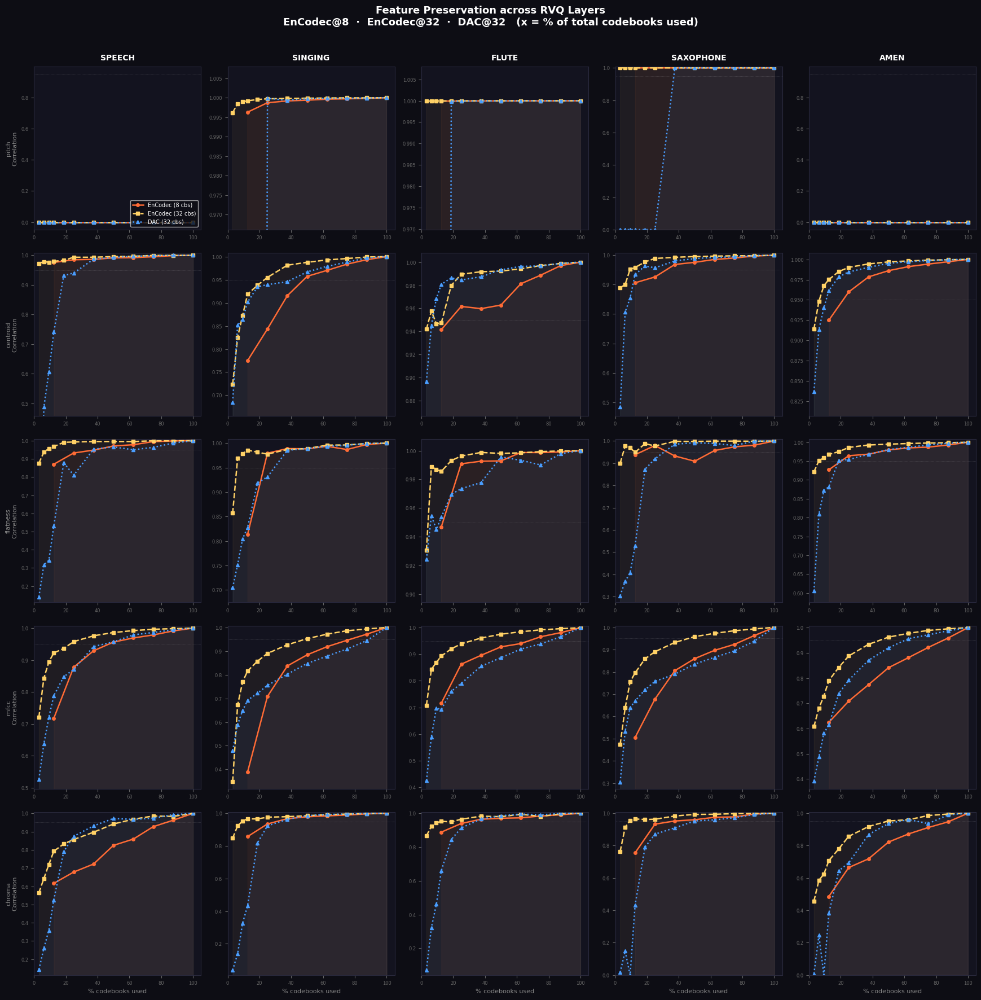

Saved: feature_preservation.png


In [22]:
x_enc8  = np.array([(q+1)/N_Q_8  * 100 for q in LEVELS_8])
x_enc32 = np.array([(q+1)/N_Q_32 * 100 for q in LEVELS])
x_dac   = np.array([(q+1)/N_Q_DAC* 100 for q in LEVELS])

feat_names  = list(feature_extractors.keys())

# codec styles
codec_styles = {
    'EnCodec@8':  {'color': '#ff6b35', 'ls': '-',  'marker': 'o',
                   'label': f'EnCodec (8 cbs)',  'x': x_enc8,  'res': res_enc8},
    'EnCodec@32': {'color': '#ffd166', 'ls': '--', 'marker': 's',
                   'label': f'EnCodec (32 cbs)', 'x': x_enc32, 'res': res_enc32},
    'DAC@32':     {'color': '#4a9eff', 'ls': ':',  'marker': '^',
                   'label': f'DAC (32 cbs)',     'x': x_dac,   'res': res_dac},
}

fig, axes = plt.subplots(
    len(feat_names), len(audio_names),
    figsize=(3.5 * len(audio_names), 3.5 * len(feat_names)),
    facecolor='#0d0d14')

for row, feat_name in enumerate(feat_names):
    for col, name in enumerate(audio_names):
        ax = axes[row][col]
        ax.set_facecolor('#13131f')

        for codec_key, style in codec_styles.items():
            corrs = style['res'][feat_name][name]
            vals  = [v if not np.isnan(v) else 0.0 for v in corrs]
            ax.plot(style['x'], vals,
                    color=style['color'], linewidth=1.8,
                    linestyle=style['ls'],
                    marker=style['marker'], markersize=4,
                    label=style['label'])
            ax.fill_between(style['x'], vals,
                            alpha=0.05, color=style['color'])

        # zoom y axis
        all_vals = [v for s in codec_styles.values()
                    for v in s['res'][feat_name][name]
                    if not np.isnan(v) and v > 0]
        if all_vals:
            ax.set_ylim(max(0, min(all_vals) - 0.03), 1.008)

        ax.axhline(0.95, color='white', linewidth=0.5,
                   linestyle=':', alpha=0.25)
        ax.set_xlim(0, 105)

        # labels only on edges
        if row == len(feat_names) - 1:
            ax.set_xlabel("% codebooks used", color='#888', fontsize=8)
        if col == 0:
            ax.set_ylabel("Correlation", color='#888', fontsize=8)

        # title only on top row
        if row == 0:
            ax.set_title(name.upper(), color='white',
                         fontsize=10, fontweight='bold', pad=8)

        # feature label on left column
        if col == 0:
            ax.set_ylabel(f"{feat_name}\nCorrelation",
                          color='#888', fontsize=8)

        ax.tick_params(colors='#666', labelsize=6)

        # legend only top-left
        if row == 0 and col == 0:
            ax.legend(facecolor='#0d0d14', labelcolor='white',
                      fontsize=7, loc='lower right',
                      framealpha=0.8)

        for spine in ax.spines.values():
            spine.set_edgecolor('#2a2a3f')

fig.patch.set_facecolor('#0d0d14')
plt.suptitle(
    "Feature Preservation across RVQ Layers\n"
    "EnCodec@8  ·  EnCodec@32  ·  DAC@32   "
    "(x = % of total codebooks used)",
    color='white', fontsize=13, y=1.01, fontweight='bold')
plt.tight_layout(h_pad=1.5, w_pad=1.0)
plt.savefig("feature_preservation.png", dpi=150,
            bbox_inches='tight', facecolor='#0d0d14')
plt.show()
print("Saved: feature_preservation.png")

### PCA latent space comparison

This plot visualizes the quantized latent space

Taking tokens_to_summary_latents with n_q=8
Taking tokens_to_summary_latents with n_q=8
Taking tokens_to_summary_latents with n_q=8
Taking tokens_to_summary_latents with n_q=8
Taking tokens_to_summary_latents with n_q=8
Taking tokens_to_summary_latents with n_q=32
Taking tokens_to_summary_latents with n_q=32
Taking tokens_to_summary_latents with n_q=32
Taking tokens_to_summary_latents with n_q=32
Taking tokens_to_summary_latents with n_q=32


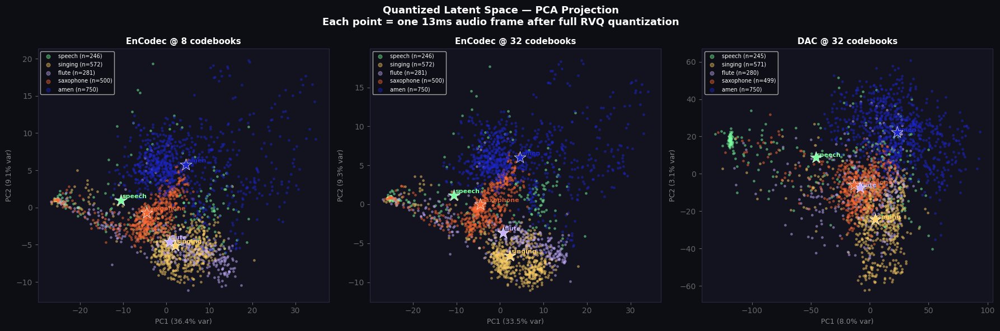

Saved: pca_latents.png


In [16]:
def get_enc_latents(tokens_dict, LOOKUP):
    out = {}
    for name, tokens in tokens_dict.items():
        lat    = tokens_to_summary_latents(tokens, LOOKUP)
        out[name] = lat.float().cpu().numpy()
    return out

def get_dac_latents(tokens_dict, dac_model, device):
    out = {}
    for name, codes_TN in tokens_dict.items():
        codes = codes_TN.T.unsqueeze(0).to(device)
        with torch.no_grad():
            z = dac_model.quantizer.from_codes(codes)[0]
        out[name] = z.squeeze(0).T.cpu().numpy()
    return out

lat_enc8  = get_enc_latents(enc_tokens_dict,    LOOKUP_QKD)
lat_enc32 = get_enc_latents(enc_tokens_32,   LOOKUP_32)
lat_dac   = get_dac_latents(dac_tokens_dict, dac_model, DEVICE)

fig, axes = plt.subplots(1, 3, figsize=(18, 6), facecolor='#0d0d14')

for ax, (title, lat_dict) in zip(axes, [
    ("EnCodec @ 8 codebooks",  lat_enc8),
    ("EnCodec @ 32 codebooks", lat_enc32),
    ("DAC @ 32 codebooks",     lat_dac),
]):
    ax.set_facecolor('#13131f')

    all_lats = np.concatenate(list(lat_dict.values()), axis=0)
    pca      = PCA(n_components=2)
    all_2d   = pca.fit_transform(all_lats)
    var      = pca.explained_variance_ratio_

    start = 0
    for name, lat in lat_dict.items():
        end  = start + len(lat)
        pts  = all_2d[start:end]
        start = end

        ax.scatter(pts[:,0], pts[:,1],
                   s=6, alpha=0.4,
                   color=colors.get(name, '#fff'),
                   label=f"{name} (n={len(pts)})")

        mx, my = pts[:,0].mean(), pts[:,1].mean()
        ax.scatter(mx, my, s=250, marker='*',
                   color=colors.get(name, '#fff'),
                   edgecolors='white', linewidths=0.5, zorder=5)
        ax.annotate(name, xy=(mx, my),
                    xytext=(mx+0.3, my+0.3),
                    color=colors.get(name, '#fff'),
                    fontsize=8, fontweight='bold')

    ax.set_xlabel(f'PC1 ({var[0]*100:.1f}% var)', color='#888', fontsize=9)
    ax.set_ylabel(f'PC2 ({var[1]*100:.1f}% var)', color='#888', fontsize=9)
    ax.set_title(title, color='white', fontsize=11, fontweight='bold')
    ax.legend(facecolor='#0d0d14', labelcolor='white',
              fontsize=7, markerscale=2)
    ax.tick_params(colors='#666')
    for spine in ax.spines.values():
        spine.set_edgecolor('#2a2a3f')

fig.patch.set_facecolor('#0d0d14')
plt.suptitle(
    "Quantized Latent Space — PCA Projection\n"
    "Each point = one 13ms audio frame after full RVQ quantization",
    color='white', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig("pca_latents.png", dpi=150,
            bbox_inches='tight', facecolor='#0d0d14')
plt.show()
print("Saved: pca_latents.png")

### Some interesting audio results

In [26]:
from IPython.display import Audio, display
sr = 24000

# ═══════════════════════════════════════════════════════════════════
# EXAMPLE 1 — EnCodec@8 Singing: pitch preserved, timbre lost
# pitch=0.996 at Q1 but mfcc=0.389
# melody recognisable but voice sounds unnatural
# ═══════════════════════════════════════════════════════════════════
print("═"*60)
print("EXAMPLE 1 — EnCodec@8 Singing: pitch preserved, timbre lost")
print("═"*60)

for q, label in [
    (0, "Q1 only  [pitch=0.996, mfcc=0.389]"),
    (1, "Q1→Q2"),
    (3, "Q1→Q4"),
    (7, "Q1→Q8  [full reconstruction]")]:
    print(f"\n  {label}")
    display(Audio(enc_decoded_8["singing"][q], rate=sr))


# ═══════════════════════════════════════════════════════════════════
# EXAMPLE 2 — Flute vs Amen at Q1 (simple vs complex)
# flute pitch=1.000, amen pitch=NaN (no stable pitch)
# flute sounds almost perfect, amen clearly degraded
# ═══════════════════════════════════════════════════════════════════
print("\n" + "═"*60)
print("EXAMPLE 2 — Flute vs Amen at Q1 (simple vs complex audio)")
print("═"*60)

print("\n  FLUTE:")
print("  Q1 only  [pitch=1.000, mfcc=0.716, chroma=0.888]")
display(Audio(enc_decoded_8["flute"][0], rate=sr))
print("  Q1→Q8 full")
display(Audio(enc_decoded_8["flute"][7], rate=sr))

print("\n  AMEN:")
print("  Q1 only  [pitch=NaN, mfcc=0.624, chroma=0.485]")
display(Audio(enc_decoded_8["amen"][0], rate=sr))
print("  Q1→Q8 full")
display(Audio(enc_decoded_8["amen"][7], rate=sr))


# ═══════════════════════════════════════════════════════════════════
# EXAMPLE 3 — EnCodec@8 vs EnCodec@32 on amen
# both return NaN for pitch — but mfcc and chroma differ
# @8 Q1: mfcc=0.624, chroma=0.485
# @32 Q1: mfcc=0.608, chroma=0.457
# subtle difference — does @32 Q1 sound slightly worse?
# ═══════════════════════════════════════════════════════════════════
print("\n" + "═"*60)
print("EXAMPLE 3 — Amen: EnCodec@8 vs EnCodec@32 at Q1")
print("Same codec, different codebook count — subtle difference")
print("═"*60)

print("\n  EnCodec@8  Q1 only  [mfcc=0.624, chroma=0.485]")
display(Audio(enc_decoded_8["amen"][0], rate=sr))
print("  EnCodec@32 Q1 only  [mfcc=0.608, chroma=0.457]")
display(Audio(enc_decoded_32["amen"][0], rate=sr))
print("  EnCodec@8  full Q1→Q8")
display(Audio(enc_decoded_8["amen"][7], rate=sr))
print("  EnCodec@32 full Q1→Q32")
display(Audio(enc_decoded_32["amen"][31], rate=sr))


# ═══════════════════════════════════════════════════════════════════
# EXAMPLE 4 — EnCodec@32 vs DAC@32 on flute: architectural difference
# EnCodec@32 Q1: pitch=1.000, chroma=0.867
# DAC@32     Q1: pitch=NaN,   chroma=0.072
# same number of codebooks — completely different Q1 behaviour
# ═══════════════════════════════════════════════════════════════════
print("\n" + "═"*60)
print("EXAMPLE 4 — EnCodec@32 vs DAC@32 on Flute")
print("Same codebook count — completely different Q1 behaviour")
print("═"*60)

print("\n  EnCodec@32  Q1 only  [pitch=1.000, chroma=0.867, mfcc=0.708]")
display(Audio(enc_decoded_32["flute"][0], rate=sr))
print("  DAC@32      Q1 only  [pitch=NaN, chroma=0.072, mfcc=0.424]")
display(Audio(dac_decoded_dict["flute"][0], rate=sr))
print("  EnCodec@32  full Q1→Q32")
display(Audio(enc_decoded_32["flute"][31], rate=sr))
print("  DAC@32      full Q1→Q32")
display(Audio(dac_decoded_dict["flute"][31], rate=sr))


# ═══════════════════════════════════════════════════════════════════
# EXAMPLE 5 — Singing MFCC: the only case DAC wins at Q1
# EnCodec@8  singing mfcc Q1=0.389
# EnCodec@32 singing mfcc Q1=0.349
# DAC@32     singing mfcc Q1=0.479  ← DAC wins despite pitch=NaN
# ═══════════════════════════════════════════════════════════════════
print("\n" + "═"*60)
print("EXAMPLE 5 — Singing MFCC: the only case DAC wins at Q1")
print("DAC Q1 has better timbre despite no detectable pitch")
print("═"*60)

print("\n  EnCodec@8   Q1 only  [pitch=0.996, mfcc=0.389]")
display(Audio(enc_decoded_8["singing"][0], rate=sr))
print("  EnCodec@32  Q1 only  [pitch=0.996, mfcc=0.349]")
display(Audio(enc_decoded_32["singing"][0], rate=sr))
print("  DAC@32      Q1 only  [pitch=NaN,   mfcc=0.479]")
display(Audio(dac_decoded_dict["singing"][0], rate=sr))


# ═══════════════════════════════════════════════════════════════════
# EXAMPLE 6 — DAC@32 singing: gradual emergence across layers
# pitch=NaN at Q1, gradually emerges across all 32 layers
# listen to how the singing voice slowly becomes recognisable
# ═══════════════════════════════════════════════════════════════════
print("\n" + "═"*60)
print("EXAMPLE 6 — DAC@32 Singing: gradual emergence across layers")
print("Expected: Q1 unrecognisable, gradually becomes singing")
print("═"*60)

for q, label in [
    (0,  "Q1 only   [pitch=NaN,   mfcc=0.479, centroid=0.685]"),
    (1,  "Q1→Q2"),
    (3,  "Q1→Q4"),
    (7,  "Q1→Q8"),
    (15, "Q1→Q16"),
    (31, "Q1→Q32 full  [pitch=1.000, mfcc=1.000]"),
]:
    print(f"\n  {label}")
    display(Audio(dac_decoded_dict["singing"][q], rate=sr))

════════════════════════════════════════════════════════════
EXAMPLE 1 — EnCodec@8 Singing: pitch preserved, timbre lost
════════════════════════════════════════════════════════════

  Q1 only  [pitch=0.996, mfcc=0.389]



  Q1→Q2



  Q1→Q4



  Q1→Q8  [full reconstruction]



════════════════════════════════════════════════════════════
EXAMPLE 2 — Flute vs Amen at Q1 (simple vs complex audio)
════════════════════════════════════════════════════════════

  FLUTE:
  Q1 only  [pitch=1.000, mfcc=0.716, chroma=0.888]


  Q1→Q8 full



  AMEN:
  Q1 only  [pitch=NaN, mfcc=0.624, chroma=0.485]


  Q1→Q8 full



════════════════════════════════════════════════════════════
EXAMPLE 3 — Amen: EnCodec@8 vs EnCodec@32 at Q1
Same codec, different codebook count — subtle difference
════════════════════════════════════════════════════════════

  EnCodec@8  Q1 only  [mfcc=0.624, chroma=0.485]


  EnCodec@32 Q1 only  [mfcc=0.608, chroma=0.457]


  EnCodec@8  full Q1→Q8


  EnCodec@32 full Q1→Q32



════════════════════════════════════════════════════════════
EXAMPLE 4 — EnCodec@32 vs DAC@32 on Flute
Same codebook count — completely different Q1 behaviour
════════════════════════════════════════════════════════════

  EnCodec@32  Q1 only  [pitch=1.000, chroma=0.867, mfcc=0.708]


  DAC@32      Q1 only  [pitch=NaN, chroma=0.072, mfcc=0.424]


  EnCodec@32  full Q1→Q32


  DAC@32      full Q1→Q32



════════════════════════════════════════════════════════════
EXAMPLE 5 — Singing MFCC: the only case DAC wins at Q1
DAC Q1 has better timbre despite no detectable pitch
════════════════════════════════════════════════════════════

  EnCodec@8   Q1 only  [pitch=0.996, mfcc=0.389]


  EnCodec@32  Q1 only  [pitch=0.996, mfcc=0.349]


  DAC@32      Q1 only  [pitch=NaN,   mfcc=0.479]



════════════════════════════════════════════════════════════
EXAMPLE 6 — DAC@32 Singing: gradual emergence across layers
Expected: Q1 unrecognisable, gradually becomes singing
════════════════════════════════════════════════════════════

  Q1 only   [pitch=NaN,   mfcc=0.479, centroid=0.685]



  Q1→Q2



  Q1→Q4



  Q1→Q8



  Q1→Q16



  Q1→Q32 full  [pitch=1.000, mfcc=1.000]


### Heatmap of codebooks utilization

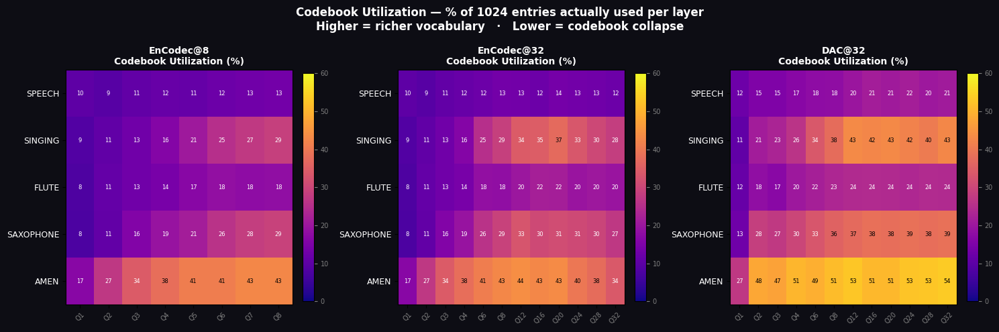

Saved: utilization.png


In [17]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), facecolor='#0d0d14')

configs = [
    ("EnCodec@8",  enc_tokens_dict,    LEVELS_8,  N_Q_8),
    ("EnCodec@32", enc_tokens_32,   LEVELS, N_Q_32),
    ("DAC@32",     dac_tokens_dict, LEVELS, N_Q_DAC),
]

for ax, (label, tokens_d, levels, n_q_total) in zip(axes, configs):
    ax.set_facecolor('#13131f')

    matrix = np.zeros((len(audio_names), len(levels)))
    for i, name in enumerate(audio_names):
        tokens = tokens_d[name]
        for j, q in enumerate(levels):
            n_unique    = tokens[:, q].unique().shape[0]
            matrix[i,j] = n_unique / K * 100

    im = ax.imshow(matrix, cmap='plasma', aspect='auto', vmin=0, vmax=60)

    ax.set_yticks(range(len(audio_names)))
    ax.set_yticklabels([n.upper() for n in audio_names],
                       color='white', fontsize=9)
    ax.set_xticks(range(len(levels)))
    ax.set_xticklabels([f"Q{q+1}" for q in levels],
                       color='gray', fontsize=7, rotation=45)
    ax.set_title(f"{label}\nCodebook Utilization (%)",
                 color='white', fontsize=10, fontweight='bold')

    for i in range(len(audio_names)):
        for j in range(len(levels)):
            ax.text(j, i, f'{matrix[i,j]:.0f}',
                    ha='center', va='center', fontsize=6,
                    color='white' if matrix[i,j] < 35 else 'black')

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04).ax.tick_params(
        colors='gray', labelsize=7)

fig.patch.set_facecolor('#0d0d14')
plt.suptitle(
    "Codebook Utilization — % of 1024 entries actually used per layer\n"
    "Higher = richer vocabulary   ·   Lower = codebook collapse",
    color='white', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig("utilization.png", dpi=150,
            bbox_inches='tight', facecolor='#0d0d14')
plt.show()
print("Saved: utilization.png")